# MANUAL NET ARCHITECTURE

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import os
import glob
import numpy as np

from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.models import Sequential
from PIL import Image

from tensorflow.keras.layers import Convolution2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Activation

from keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt

In [3]:

miner = 'DATASET/train/miner'
nodisease = 'DATASET/train/nodisease'
phoma = 'DATASET/train/phoma'
rust = 'DATASET/train/rust'


In [4]:
def plot_images(item_dir, n=6):
    all_item_dir = os.listdir(item_dir)
    item_files = [os.path.join(item_dir, file) for file in all_item_dir][:n]
    
    plt.figure(figsize=(80, 40))
    for idx, img_path in enumerate(item_files):
        plt.subplot(3, n, idx+1)
        img = plt.imread(img_path)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
    
    plt.tight_layout()
    
def image_details_print(data,path):
    print('======== Images in: ', path)
    for key,values in data.items():
        print(key,':\t', values)


def images_details(path):
    files=[f for f in glob.glob(path + "**/*.*", recursive=True)]
    data={}
    data['Images_count']=len(files)
    data['Min_width']=10**100
    data['Max_width']=0
    data['Min_height']=10**100
    data['Max_height']=0
    
    for f in files:
        img=Image.open(f)
        width,height=img.size
        data['Min_width']=min(width,data['Min_width'])
        data['Max_width']=max(width, data['Max_width'])
        data['Min_height']=min(height, data['Min_height'])
        data['Max_height']=max(height, data['Max_height'])
        
    image_details_print(data,path)


TRAINING DATA FOR miner:

======== Images in:  DATASET/train/miner
Images_count :	 332
Min_width :	 2048
Max_width :	 2048
Min_height :	 1024
Max_height :	 1024



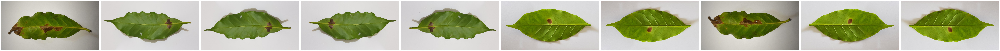

In [5]:
print("")
print("TRAINING DATA FOR miner:")
print("")
images_details(miner)
print("")
plot_images(miner, 10) 


TRAINING DATA FOR nodisease:

======== Images in:  DATASET/train/nodisease
Images_count :	 284
Min_width :	 2048
Max_width :	 2048
Min_height :	 1024
Max_height :	 1024



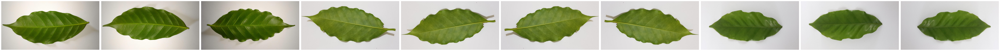

In [6]:
print("")
print("TRAINING DATA FOR nodisease:")
print("")
images_details(nodisease)
print("")
plot_images(nodisease, 10)


TRAINING DATA FOR phoma:

======== Images in:  DATASET/train/phoma
Images_count :	 388
Min_width :	 2048
Max_width :	 2048
Min_height :	 1024
Max_height :	 1024



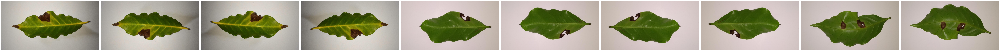

In [7]:
print("")
print("TRAINING DATA FOR phoma:")
print("")
images_details(phoma)
print("")
plot_images(phoma, 10)


TRAINING DATA FOR rust:

======== Images in:  DATASET/train/rust
Images_count :	 260
Min_width :	 2048
Max_width :	 2048
Min_height :	 1024
Max_height :	 1024



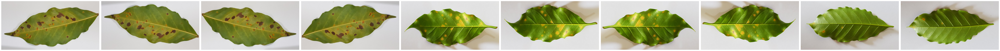

In [8]:
print("")
print("TRAINING DATA FOR rust:")
print("")
images_details(rust)
print("")
plot_images(rust, 10)

In [9]:
train_datagen=ImageDataGenerator(rescale=1./255,shear_range=0.2,zoom_range=0.2,horizontal_flip=True)
training_set=train_datagen.flow_from_directory('dataset/train',target_size=(224,224),batch_size=32,class_mode='categorical')

Found 1264 images belonging to 4 classes.


In [10]:
test_datagen=ImageDataGenerator(rescale=1./255)
test_set=test_datagen.flow_from_directory('dataset/test',target_size=(224,224),batch_size=32,class_mode='categorical')

Found 391 images belonging to 4 classes.


In [11]:
Classifier=Sequential()
Classifier.add(Convolution2D(32,(3,3),input_shape=(224,224,3),activation='relu'))
Classifier.add(MaxPooling2D(pool_size=(2,2)))
Classifier.add(Flatten())
Classifier.add(Dense(38, activation='relu'))
Classifier.add(Dense(4, activation='softmax'))
Classifier.compile(optimizer='rmsprop',loss='categorical_crossentropy',metrics=['accuracy'])

In [12]:
model_path = "MANUAL.h5"

callbacks = [
    ModelCheckpoint(model_path, monitor='accuracy', verbose=1, save_best_only=True)
]

In [13]:
epochs = 10
batch_size = 64

In [14]:
#### Fitting the model
history = Classifier.fit(
           training_set, steps_per_epoch=training_set.samples // batch_size, 
           epochs=epochs, 
           validation_data=test_set,validation_steps=test_set.samples // batch_size,
           callbacks=callbacks)

Epoch 1/10
19/19 [==============================] - ETA: 0s - loss: 49.8240 - accuracy: 0.2432
Epoch 1: accuracy improved from -inf to 0.24324, saving model to MANUAL.h5
19/19 [==============================] - 52s 3s/step - loss: 49.8240 - accuracy: 0.2432 - val_loss: 11.0536 - val_accuracy: 0.3177
Epoch 2/10
19/19 [==============================] - ETA: 0s - loss: 9.1471 - accuracy: 0.2895
Epoch 2: accuracy improved from 0.24324 to 0.28947, saving model to MANUAL.h5
19/19 [==============================] - 51s 3s/step - loss: 9.1471 - accuracy: 0.2895 - val_loss: 4.2325 - val_accuracy: 0.4427
Epoch 3/10
19/19 [==============================] - ETA: 0s - loss: 3.1769 - accuracy: 0.3378
Epoch 3: accuracy improved from 0.28947 to 0.33784, saving model to MANUAL.h5
19/19 [==============================] - 54s 3s/step - loss: 3.1769 - accuracy: 0.3378 - val_loss: 1.3781 - val_accuracy: 0.6042
Epoch 4/10
19/19 [==============================] - ETA: 0s - loss: 1.3379 - accuracy: 0.4572
Epo

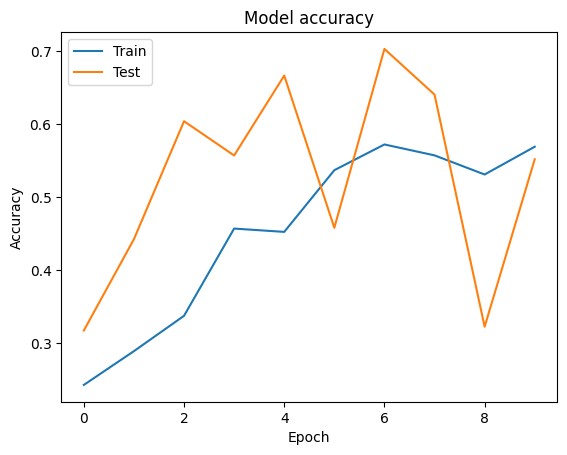

In [15]:
import matplotlib.pyplot as plt

def graph():
    #Plot training & validation accuracy values
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()

graph()

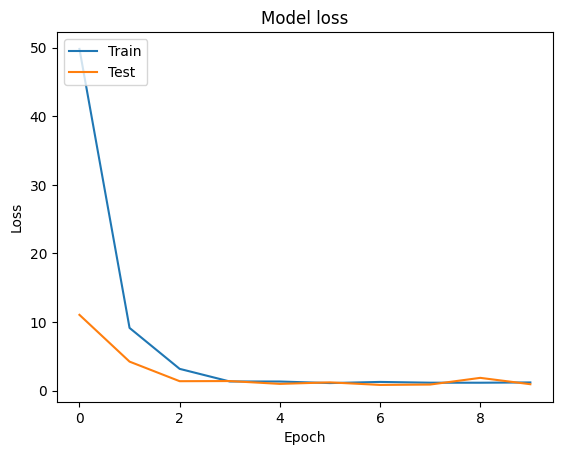

In [16]:
import matplotlib.pyplot as plt

def graph():
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()
graph()